In [2]:
import pandas as pd
import matplotlib.pyplot as plt

In [3]:
ratios = pd.read_csv(r'../../results/diesel-consumption-distribution-compared-to-busiest-day.csv', low_memory=False)

In [4]:
ratios

,Date,UniqueTripsCount,Diesel,DieselRatio
0,2021-10-01,2407,3983.579011,1.061066
1,2021-10-02,1372,2355.385148,0.627380
2,2021-10-03,682,1056.628379,0.281443
3,2021-10-04,2394,3689.101667,0.982629
4,2021-10-05,2344,3721.028308,0.991133
...,...,...,...,...
358,2022-09-26,2256,3309.927455,0.881632
359,2022-09-27,2262,3483.426838,0.927845
360,2022-09-28,2274,3341.437897,0.890025
361,2022-09-29,2271,3439.409862,0.916121


In [5]:
ratios['DieselRatio'].max()

1.061065650677

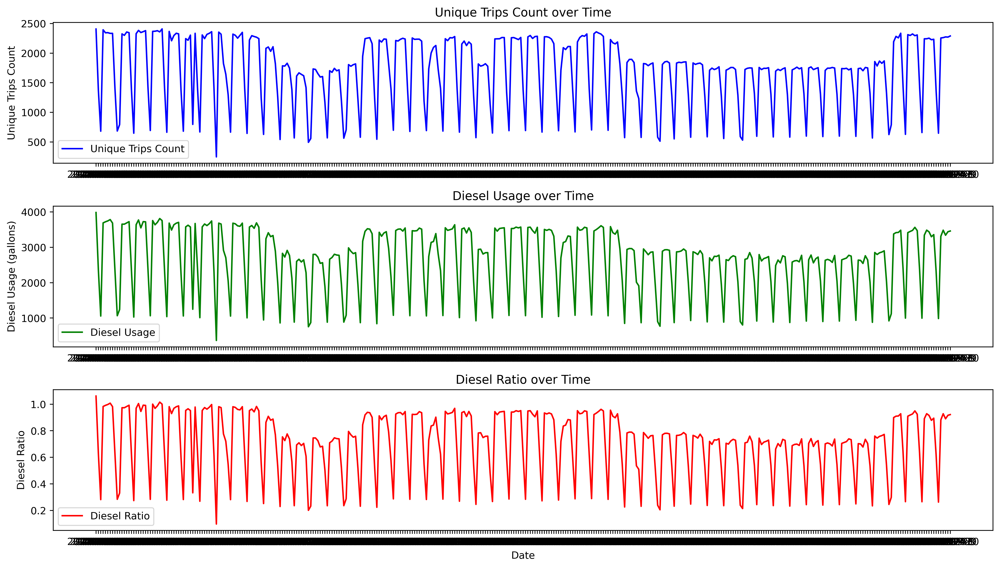

In [6]:
# Plotting the data
plt.figure(figsize=(14, 8), dpi=400)

plt.subplot(3, 1, 1)
plt.plot(ratios['Date'], ratios['UniqueTripsCount'], label='Unique Trips Count', color='blue')
plt.title('Unique Trips Count over Time')
plt.ylabel('Unique Trips Count')
plt.legend()

plt.subplot(3, 1, 2)
plt.plot(ratios['Date'], ratios['Diesel'], label='Diesel Usage', color='green')
plt.title('Diesel Usage over Time')
plt.ylabel('Diesel Usage (gallons)')
plt.legend()

plt.subplot(3, 1, 3)
plt.plot(ratios['Date'], ratios['DieselRatio'], label='Diesel Ratio', color='red')
plt.title('Diesel Ratio over Time')
plt.xlabel('Date')
plt.ylabel('Diesel Ratio')
plt.legend()

plt.tight_layout()
plt.show()

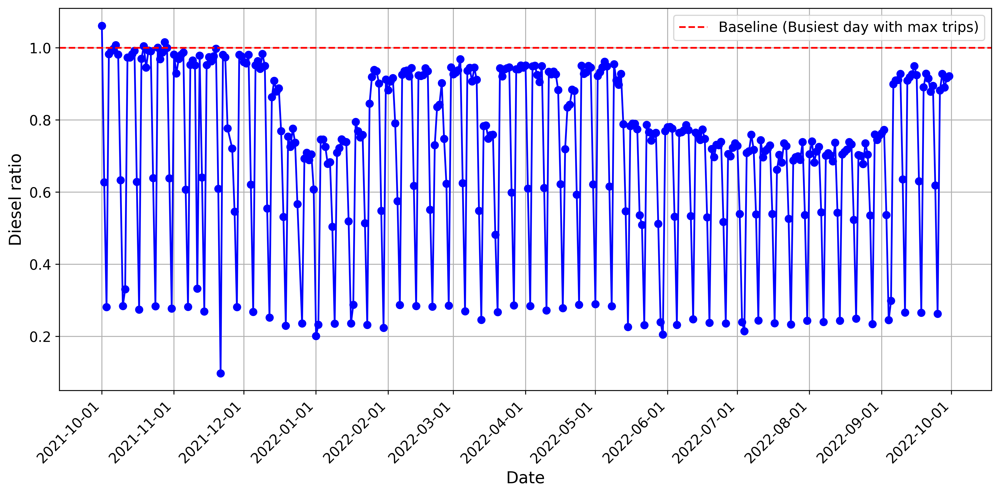

In [7]:
ratios['Date'] = pd.to_datetime(ratios['Date'])

# Plot without the blue part in the legend
plt.figure(figsize=(12, 6), dpi=400)
plt.plot(ratios['Date'], ratios['DieselRatio'], color='b', marker='o')
plt.axhline(y=1, color='r', linestyle='--', label='Baseline (Busiest day with max trips)')
#plt.title('Scaling Factor $f_d$ for Extrapolating Yearly Energy Consumption', fontsize=16)
plt.xlabel('Date', fontsize=14)
plt.ylabel('Diesel ratio', fontsize=14)
plt.legend(fontsize=12)
plt.grid(True)

# Ensure correct x-axis labels by using the datetime format in the x-axis
plt.gca().xaxis.set_major_formatter(plt.matplotlib.dates.DateFormatter('%Y-%m-%d'))
plt.gca().xaxis.set_major_locator(plt.matplotlib.dates.MonthLocator())
plt.gcf().autofmt_xdate(rotation=45)

# Increase the font size for x and y ticks
plt.xticks(fontsize=12)
plt.yticks(fontsize=12)

plt.tight_layout()

# Show plot
plt.show()

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


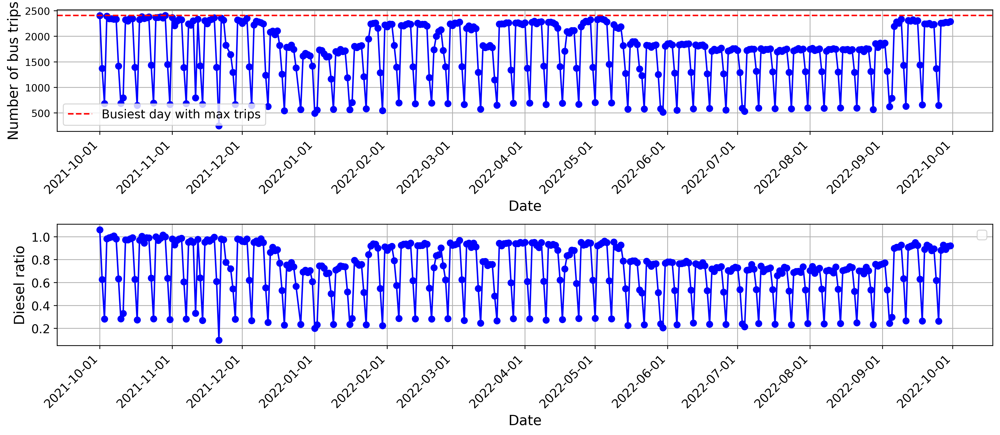

In [8]:
# Plotting the data
plt.figure(figsize=(14, 8), dpi=400)

# First plot formatting similar to the second
plt.subplot(3, 1, 1)
plt.plot(ratios['Date'], ratios['UniqueTripsCount'], color='b', marker='o')
plt.axhline(y=ratios['UniqueTripsCount'].max(), color='r', linestyle='--', label='Busiest day with max trips')
plt.xlabel('Date', fontsize=14)
plt.ylabel('Number of bus trips', fontsize=14)
plt.legend(fontsize=12)
plt.grid(True)

plt.subplot(3, 1, 2)
plt.plot(ratios['Date'], ratios['DieselRatio'], color='b', marker='o')
#plt.axhline(y=1, color='r', linestyle='--', label='Baseline (Busiest day with max trips)')
#plt.title('Scaling Factor $f_d$ for Extrapolating Yearly Energy Consumption', fontsize=16)
plt.xlabel('Date', fontsize=14)
plt.ylabel('Diesel ratio', fontsize=14)
plt.legend(fontsize=12)
plt.grid(True)


# Apply date formatting to both subplots
for ax in plt.gcf().axes:
    ax.xaxis.set_major_formatter(plt.matplotlib.dates.DateFormatter('%Y-%m-%d'))
    ax.xaxis.set_major_locator(plt.matplotlib.dates.MonthLocator())
    plt.setp(ax.get_xticklabels(), rotation=45, ha="right", fontsize=12)

# Increase font size for y ticks
plt.yticks(fontsize=12)

plt.tight_layout()
plt.show()

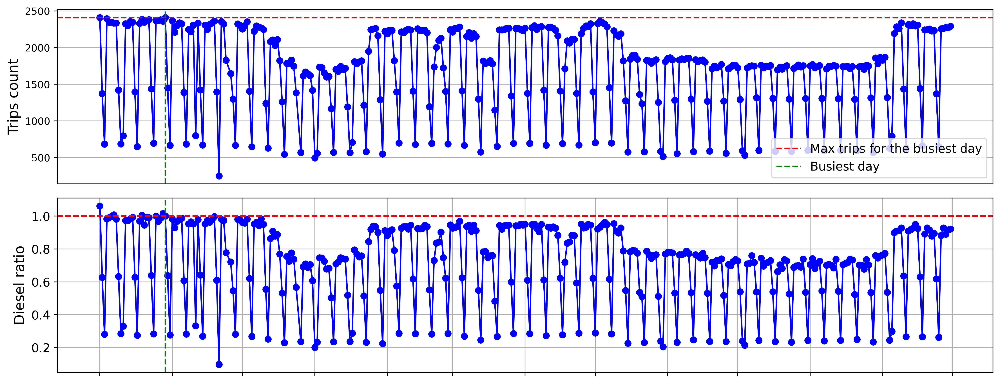

In [9]:
# Updating the code based on your requirements to only show x-axis labels on the bottom plot
# and highlight the busiest day on the x-axis

import matplotlib.dates as mdates

busiest_day = ratios['Date'][ratios['UniqueTripsCount'].idxmax()]

plt.figure(figsize=(14, 8), dpi=400)

# First plot formatting similar to the second, no x-axis labels here
plt.subplot(3, 1, 1)
plt.plot(ratios['Date'], ratios['UniqueTripsCount'], color='b', marker='o')
plt.axhline(y=ratios['UniqueTripsCount'].max(), color='r', linestyle='--', label='Max trips for the busiest day')
plt.axvline(x=busiest_day, color='g', linestyle='--', label='Busiest day')

plt.ylabel('Trips count', fontsize=14)
plt.legend(fontsize=12)
plt.grid(True)

# Removing x-axis labels from the first plot
plt.gca().xaxis.set_visible(False)

# Second plot with x-axis labels
plt.subplot(3, 1, 2)
plt.plot(ratios['Date'], ratios['DieselRatio'], color='b', marker='o')
plt.axvline(x=busiest_day, color='g', linestyle='--', label='Busiest Day')
plt.axhline(y=1, color='r', linestyle='--', label='Baseline (Busiest day with max trips)')
plt.xlabel('Date', fontsize=14)
plt.ylabel('Diesel ratio', fontsize=14)
#plt.legend(fontsize=12)
plt.grid(True)

# Apply date formatting only to the bottom plot
plt.gca().xaxis.set_major_formatter(mdates.DateFormatter('%Y-%m-%d'))
plt.gca().xaxis.set_major_locator(mdates.MonthLocator())
plt.gcf().autofmt_xdate(rotation=45)

# Increase font size for y ticks
plt.yticks(fontsize=12)

plt.tight_layout()
plt.show()


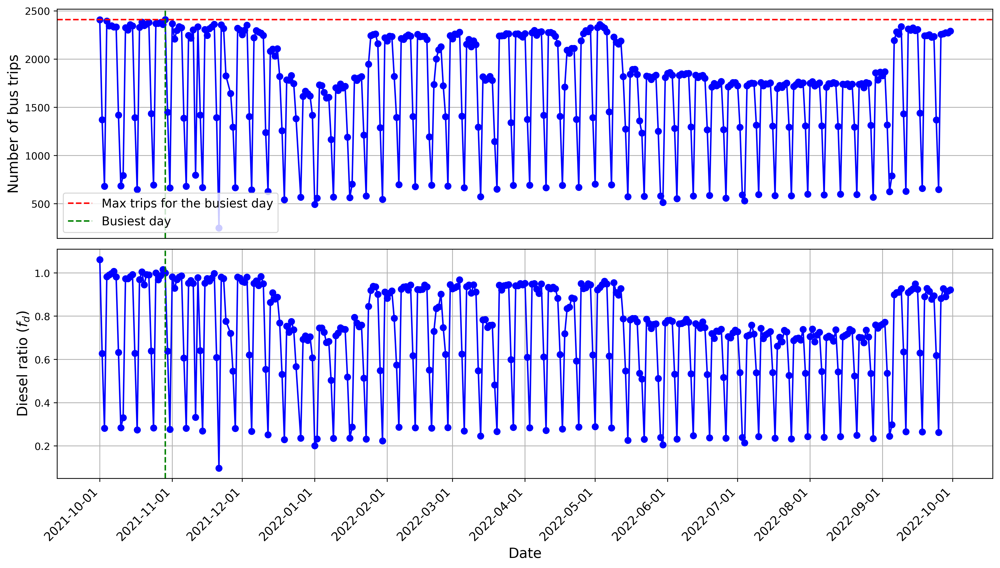

In [10]:
# Adjusting the layout to reduce the white space between the two plots
plt.figure(figsize=(14, 8), dpi=400)

# First plot formatting similar to the second, no x-axis labels here
plt.subplot(2, 1, 1)
plt.plot(ratios['Date'], ratios['UniqueTripsCount'], color='b', marker='o')
plt.axhline(y=ratios['UniqueTripsCount'].max(), color='r', linestyle='--', label='Max trips for the busiest day')
plt.axvline(x=busiest_day, color='g', linestyle='--', label='Busiest day')
plt.ylabel('Number of bus trips', fontsize=14)
plt.legend(fontsize=12)
plt.grid(True)

# Remove x-axis labels from the first plot
plt.gca().xaxis.set_visible(False)

# Second plot with x-axis labels
plt.subplot(2, 1, 2)
plt.plot(ratios['Date'], ratios['DieselRatio'], color='b', marker='o')
plt.axvline(x=busiest_day, color='g', linestyle='--', label='Busiest Day')
#plt.axhline(y=1, color='r', linestyle='--', label='Baseline (Busiest day with max trips)')
plt.xlabel('Date', fontsize=14)
plt.ylabel(r'Diesel ratio ($f_d$)', fontsize=14)
#plt.legend(fontsize=12)
plt.grid(True)

# Apply date formatting only to the bottom plot
plt.gca().xaxis.set_major_formatter(mdates.DateFormatter('%Y-%m-%d'))
plt.gca().xaxis.set_major_locator(mdates.MonthLocator())
plt.xticks(rotation=45, ha="right", fontsize=12)

# Reduce the space between the plots
plt.subplots_adjust(hspace=0.05)

# Ensure the ticks and labels are visible on the bottom plot
plt.tight_layout()
plt.show()


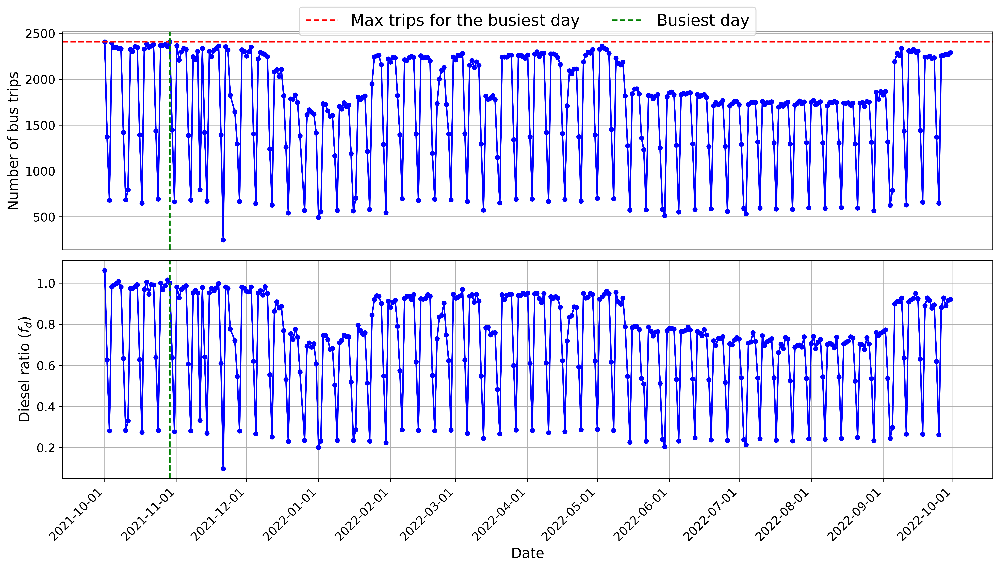

In [11]:
# Adjusting the layout to reduce the white space between the two plots
plt.figure(figsize=(14, 8), dpi=600)

# First plot formatting similar to the second, no x-axis labels here
plt.subplot(2, 1, 1)
plt.plot(ratios['Date'], ratios['UniqueTripsCount'], color='b', marker='o', markersize=4)
plt.axhline(y=ratios['UniqueTripsCount'].max(), color='r', linestyle='--', label='Max trips for the busiest day')
plt.axvline(x=busiest_day, color='g', linestyle='--', label='Busiest day')
plt.ylabel('Number of bus trips', fontsize=14)
plt.yticks(fontsize=12)
plt.legend(fontsize=16, loc='upper center', bbox_to_anchor=(0.5, 1.15), ncol=2)

plt.grid(True)

# Remove x-axis labels from the first plot
plt.gca().xaxis.set_visible(False)

# Second plot with x-axis labels
plt.subplot(2, 1, 2)
plt.plot(ratios['Date'], ratios['DieselRatio'], color='b', marker='o', markersize=4)
plt.axvline(x=busiest_day, color='g', linestyle='--', label='Busiest Day')
#plt.axhline(y=1, color='r', linestyle='--', label='Baseline (Busiest day with max trips)')
plt.xlabel('Date', fontsize=14)
plt.ylabel(r'Diesel ratio ($f_d$)', fontsize=14)
#plt.legend(fontsize=12)
plt.grid(True)

# Apply date formatting only to the bottom plot
plt.gca().xaxis.set_major_formatter(mdates.DateFormatter('%Y-%m-%d'))
plt.gca().xaxis.set_major_locator(mdates.MonthLocator())
plt.xticks(rotation=45, ha="right", fontsize=12)
plt.yticks(fontsize=12)

# Reduce the space between the plots
plt.subplots_adjust(hspace=0.05)

# Ensure the ticks and labels are visible on the bottom plot
plt.tight_layout()
plt.show()


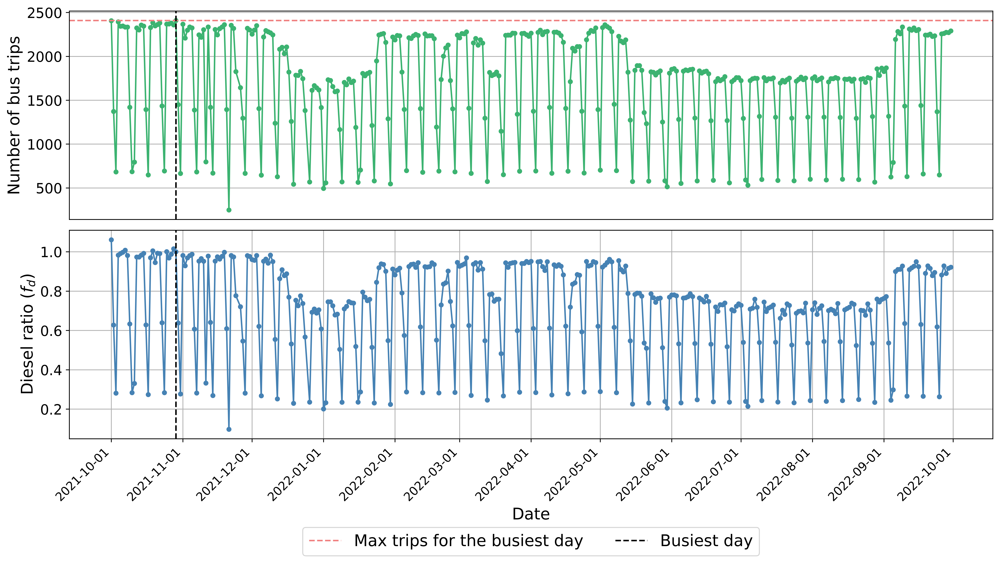

In [12]:
# Adjusting the layout to reduce the white space between the two plots
plt.figure(figsize=(14, 8), dpi=600)

# First plot formatting similar to the second, no x-axis labels here
plt.subplot(2, 1, 1)
plt.plot(ratios['Date'], ratios['UniqueTripsCount'], color='mediumseagreen', marker='o', markersize=4)
plt.axhline(y=ratios['UniqueTripsCount'].max(), color='lightcoral', linestyle='--', label='Max trips for the busiest day')
plt.axvline(x=busiest_day, color='black', linestyle='--', label='Busiest day')
plt.ylabel('Number of bus trips', fontsize=16)
plt.yticks(fontsize=14)

plt.grid(True)

# Remove x-axis labels from the first plot
plt.gca().xaxis.set_visible(False)

# Second plot with x-axis labels
plt.subplot(2, 1, 2)
plt.plot(ratios['Date'], ratios['DieselRatio'], color='steelblue', marker='o', markersize=4)
# Remove the duplicate label for the "Busiest day"
plt.axvline(x=busiest_day, color='black', linestyle='--')  # No label here
plt.xlabel('Date', fontsize=16)
plt.ylabel(r'Diesel ratio ($f_d$)', fontsize=16)
plt.grid(True)

# Apply date formatting only to the bottom plot
plt.gca().xaxis.set_major_formatter(mdates.DateFormatter('%Y-%m-%d'))
plt.gca().xaxis.set_major_locator(mdates.MonthLocator())
plt.xticks(rotation=45, ha="right", fontsize=12)
plt.yticks(fontsize=14)

# Reduce the space between the plots
plt.subplots_adjust(hspace=0.05)

# Create a combined legend and place it below the entire figure
lines_labels = [ax.get_legend_handles_labels() for ax in plt.gcf().axes]
lines, labels = [sum(lol, []) for lol in zip(*lines_labels)]
plt.legend(lines, labels, loc='lower center', bbox_to_anchor=(0.5, -0.6), ncol=2, fontsize=16)

# Ensure the layout is tight
plt.tight_layout()

plt.show()


In [15]:
sorted_ratios = ratios.sort_values(by='UniqueTripsCount', ascending=False)
sorted_ratios

,Date,UniqueTripsCount,Diesel,DieselRatio
28,2021-10-29,2409,3754.319074,1.000000
0,2021-10-01,2407,3983.579011,1.061066
3,2021-10-04,2394,3689.101667,0.982629
18,2021-10-19,2384,3771.993711,1.004708
21,2021-10-22,2380,3719.437636,0.990709
...,...,...,...,...
78,2021-12-19,542,861.942116,0.229587
274,2022-07-04,531,804.161369,0.214196
239,2022-05-30,513,769.198677,0.204884
90,2022-01-01,494,754.217998,0.200893
